# 1. Introduction

<!-- Bab pengenalan harus diisi dengan identitas, gambaran besar dataset yang digunakan, dan objective yang ingin dicapai. -->
## Project 3

```
Nama        : Reski Hidayat

Objective   :
This program is made to predict and detected picture Smoking and Not Smoking using Computer Vision

```

We use dataset from [**Kaggle.com/Smoker Detection Image classification Dataset**](https://www.kaggle.com/datasets/sujaykapadnis/smoking/data)

# 2. Import Libraries

In [41]:
# Import Libraries
import os, random, math, cv2 
from PIL import Image 

import time

import pandas as pd
import numpy as np 
import tensorflow as tf 
import seaborn as sns
from sklearn.metrics import classification_report
from pathlib import Path
import matplotlib.pyplot as plt

from glob import glob

from tensorflow.keras.models import Sequential, Model 
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input, BatchNormalization 
from tensorflow.keras.preprocessing.image import ImageDataGenerator, DirectoryIterator 
from tensorflow.keras.regularizers import l2

# Library to suppress warnings or deprecation notes
import warnings
warnings.filterwarnings('ignore')

# 3. Data Loading

In [2]:
# Define path

main_path = 'D:/HCK015/Phase 2/Week 1/GC 7/p2-ftds015-hck-g7-Reaumurr/input/smoking'
train_path = os.path.join('D:/HCK015/Phase 2/Week 1/GC 7/p2-ftds015-hck-g7-Reaumurr/input/smoking/Training')
test_path = os.path.join('D:/HCK015/Phase 2/Week 1/GC 7/p2-ftds015-hck-g7-Reaumurr/input/smoking/Testing')
val_path = os.path.join('D:/HCK015/Phase 2/Week 1/GC 7/p2-ftds015-hck-g7-Reaumurr/input/smoking/Validation')

* main_path: The root directory where all smoking data is located.
* train_path: The directory path for training data, located within the main smoking data directory.
* test_path: The directory path for testing data, also located within the main smoking data directory.
* val_path: The directory path for validation data, again located within the main smoking data directory.

In [3]:
# Check how many data in `train_path` and `test_path`

def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Test Path')
check_path(test_path)
print('')

print('Validation Path')
check_path(val_path)
print('')

Train Path
Total Data - Not Smoking : 358
Total Data - Smoking : 358

Test Path
Total Data - Not Smoking : 112
Total Data - Smoking : 112

Validation Path
Total Data - Not Smoking : 90
Total Data - Smoking : 90



There are 358 data points for both smoking and non-smoking individuals in the train_path directory, 112 data points for both categories in the test_path directory, and 90 data points for both categories in the validation_path directory.

In [4]:
# Function to visualize the first 5 images from each class

def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

This will visualize the first 5 images from each class.

Class :  Not Smoking


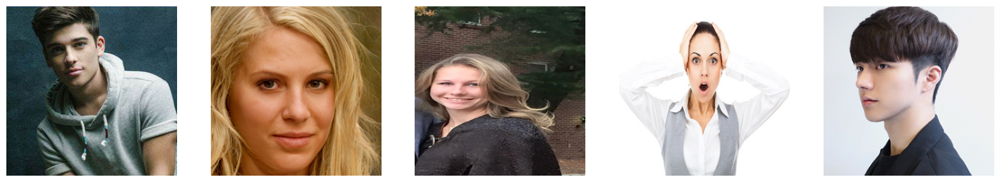

Class :  Smoking


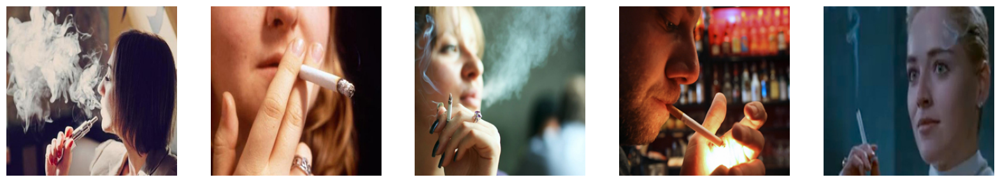

In [5]:
# Visualization of train_path

plot_images(train_path)

Visualize the first 5 images from each class in the train_path directory.

Class :  Not Smoking


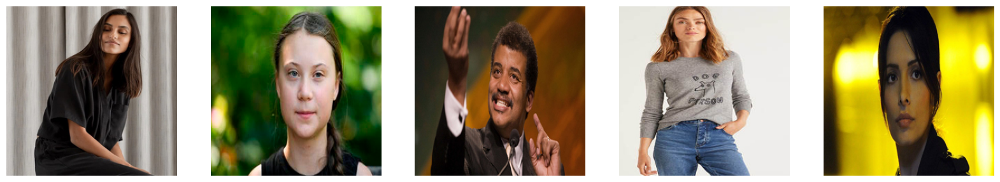

Class :  Smoking


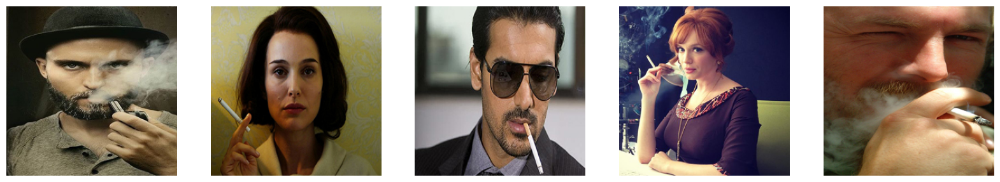

In [6]:
# Visualization of `test_path`

plot_images(test_path)

Visualize the first 5 images from each class in the test_path directory.

Class :  Not Smoking


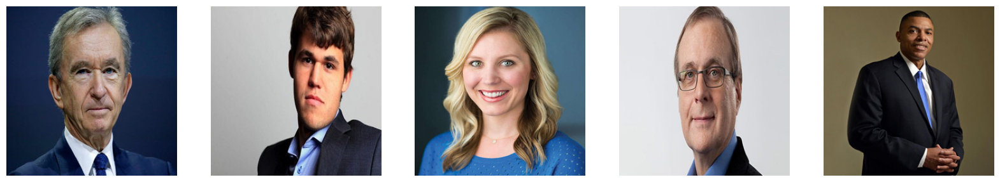

Class :  Smoking


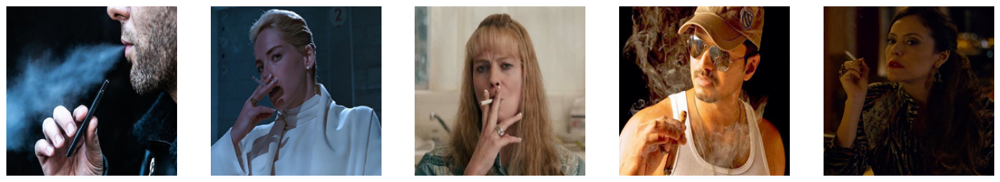

In [7]:
plot_images(val_path)

Visualize the first 5 images from each class in the val_path directory.

# 4. Exploratory Data Analysis (EDA)

In [8]:
# Define hyperparameters

img_height= 220
img_width= 220
batch_size= 64

These hyperparameters are used to configure the image preprocessing and training parameters for a machine learning model. For example, the img_height and img_width hyperparameters may be used to resize images to a consistent size before feeding them into a neural network. The batch_size hyperparameter may be used to determine how many images are processed at once during training.

By setting these hyperparameters, the user can control the behavior of the machine learning model and optimize its performance for a specific task.

In [9]:
# Create batch generator for train-set, val-set, and test-set

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                validation_split=0.4)

train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='binary',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_set = train_datagen.flow_from_directory(train_path,
                                            target_size=(img_height,img_width),
                                            class_mode='binary',
                                            subset='validation',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_set = train_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='binary',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 430 images belonging to 2 classes.
Found 286 images belonging to 2 classes.
Found 224 images belonging to 2 classes.


Batch generators can be used to feed data into a machine learning model during training, validation, and testing. The flow_from_directory method generates batches of images and labels from a directory of images. The target_size and class_mode hyperparameters are used to preprocess the images and labels, respectively. The batch_size hyperparameter is used to control the number of images processed at once during training, validation, and testing. The shuffle and seed hyperparameters are used to control the order of the images in the batches.

In [10]:
# Show labels

train_set.class_indices

{'Not Smoking': 0, 'Smoking': 1}

This mapping is used to convert the class labels to integer values during training, validation, and testing. The integer values are then used to train the machine learning model. By mapping the class labels to integer values, the model can learn to predict the integer values associated with each image, which can then be mapped back to the original class labels for interpretation.

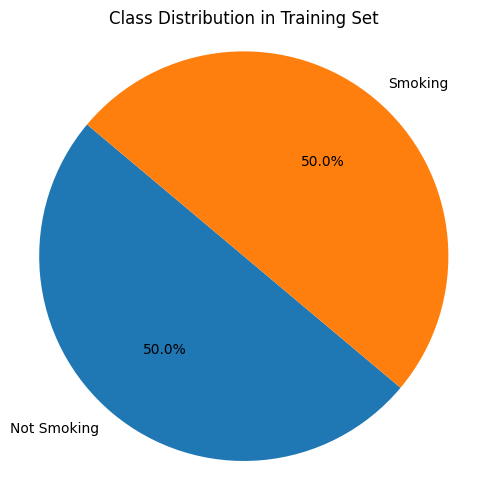

In [11]:
# Get class labels and indices from the train_set
class_labels = list(train_set.class_indices.keys())

# Get the labels of all samples in the training set
train_labels = train_set.classes

# Count the number of samples for each class in the training set
class_counts = [0] * len(class_labels)
for label in train_labels:
    class_counts[label] += 1

# Plot the class distribution using a pie chart
plt.figure(figsize=(5, 5))
plt.pie(class_counts, labels=class_labels, autopct='%1.1f%%', startangle=140)
plt.title('Class Distribution in Training Set')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()


Figure above shows a `balanced` distribution of image in the train set

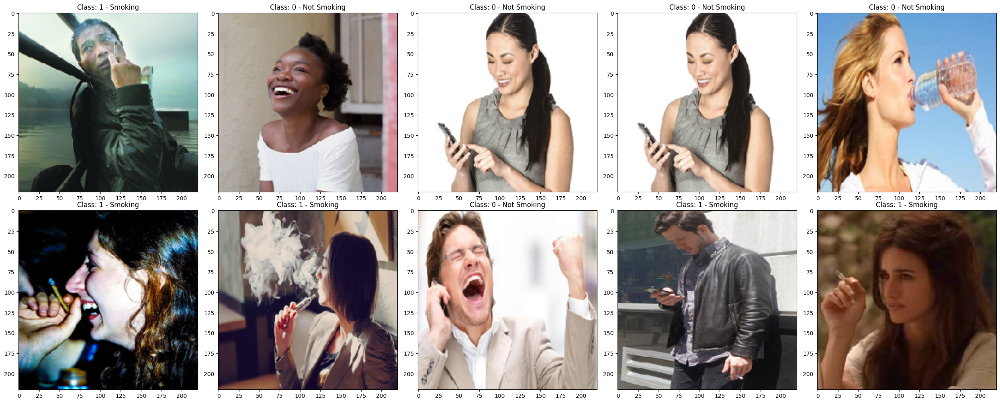

In [38]:
# Get first batch of data from the DirectoryIterator
batch = train_set.__next__()

# Generate 10 random indices from the batch
idx = np.random.randint(len(batch[0]), size=10)

# Create a figure and subplots
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))

class_names = ['Not Smoking', 'Smoking']

# Iterate over the subplots and display the images and labels
n = 0
for i in range(2):
    for j in range(5):
        img, class_label = batch[0][idx[n]], batch[1][idx[n]]
        ax[i][j].imshow(img)
        class_name = class_names[int(class_label)]  # Menggunakan nilai label langsung
        ax[i][j].title.set_text(f"Class: {int(class_label)} - {class_name}")
        n += 1

plt.tight_layout()
plt.show()


Visualize a batch of images and their corresponding labels from the train_set dataset by randomly selecting 10 images from the batch to provides a representative sample of the data

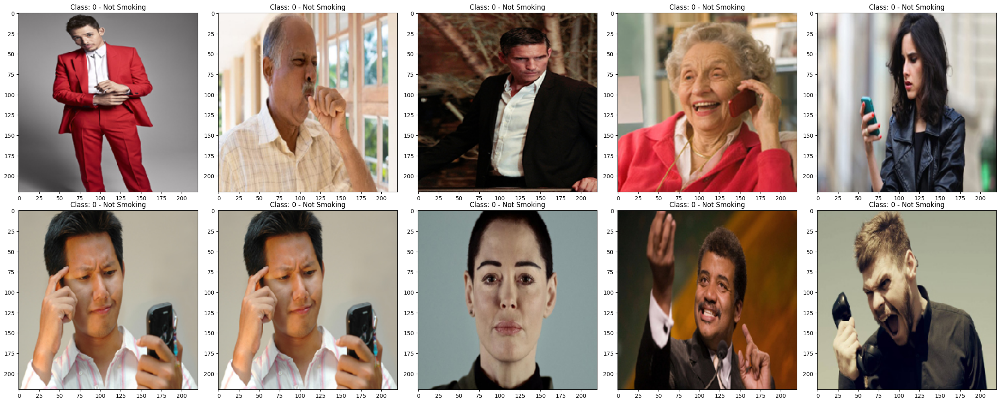

In [39]:
# Get first batch of data from the DirectoryIterator
batch = test_set.__next__()

# Generate 10 random indices from the batch
idx = np.random.randint(len(batch[0]), size=10)

# Create a figure and subplots
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))

class_names = ['Not Smoking', 'Smoking']

# Iterate over the subplots and display the images and labels
n = 0
for i in range(2):
    for j in range(5):
        img, class_label = batch[0][idx[n]], batch[1][idx[n]]
        ax[i][j].imshow(img)
        class_name = class_names[int(class_label)]  # Menggunakan nilai label langsung
        ax[i][j].title.set_text(f"Class: {int(class_label)} - {class_name}")
        n += 1

plt.tight_layout()
plt.show()


Visualize a batch of images and their corresponding labels from the test_set dataset by randomly selecting 10 images from the batch to provides a representative sample of the data

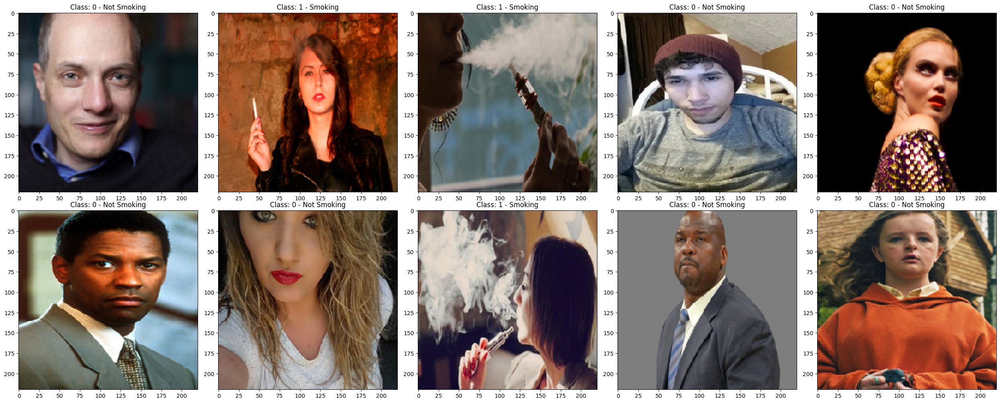

In [40]:
# Get first batch of data from the DirectoryIterator
batch = val_set.__next__()

# Generate 10 random indices from the batch
idx = np.random.randint(len(batch[0]), size=10)

# Create a figure and subplots
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))

class_names = ['Not Smoking', 'Smoking']

# Iterate over the subplots and display the images and labels
n = 0
for i in range(2):
    for j in range(5):
        img, class_label = batch[0][idx[n]], batch[1][idx[n]]
        ax[i][j].imshow(img)
        class_name = class_names[int(class_label)]  # Menggunakan nilai label langsung
        ax[i][j].title.set_text(f"Class: {int(class_label)} - {class_name}")
        n += 1

plt.tight_layout()
plt.show()


Visualize a batch of images and their corresponding labels from the val_set dataset by randomly selecting 10 images from the batch to provides a representative sample of the data

# 5. Feature Engineering

## Data Augmentation

In [13]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_final = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                    rotation_range=20,
                                                                    zoom_range=0.05,
                                                                    width_shift_range=0.05,
                                                                    height_shift_range=0.05,
                                                                    shear_range=0.05,
                                                                    horizontal_flip=True,
                                                                    validation_split=0.4)

train_set_final = train_datagen_final.flow_from_directory(train_path,
                                                      target_size=(img_height,img_width),
                                                      class_mode='binary',
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set_final = train_datagen_final.flow_from_directory(val_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='binary',
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)


test_set_final = train_datagen_final.flow_from_directory(test_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='binary',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

Found 430 images belonging to 2 classes.
Found 72 images belonging to 2 classes.
Found 224 images belonging to 2 classes.


We used to create a batch generator for the training, validation, and test sets of a dataset by applying various image augmentation techniques to the training set, so it can help improve the model's performance and prevent overfitting.

# 6. ANN Training (Sequential API/Functional API)

## 6.1 Sequential API

### 6.1.1 Model Definition

In [129]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [130]:
# Create Sequential API model
model1_seq = Sequential()

# Add input layer
model1_seq.add(Input(shape=(img_height, img_width,3)))

model1_seq.add(Conv2D(32, (3,3), activation='relu'))
model1_seq.add(MaxPooling2D(2, 2))
model1_seq.add(Conv2D(64, (3,3), activation='relu'))
model1_seq.add(MaxPooling2D(2, 2))
model1_seq.add(Conv2D(128, (3,3),activation='relu'))
model1_seq.add(MaxPooling2D(2, 2))
model1_seq.add(Flatten())
model1_seq.add(Dropout(0.5))
model1_seq.add(Dense(512, activation='relu'))
model1_seq.add(Dense(1, activation='sigmoid'))

# Compile
model1_seq.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model1_seq.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 218, 218, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 109, 109, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 107, 107, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    40,960,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,054,273 (156.61 MB)

 Trainable params: 41,054,273 (156.61 MB)

 Non-trainable params: 0 (0.00 B)

The model architecture consists of the following layers:

- Input Layer: The input layer takes an image of shape (img_height, img_width, 3) as input, where img_height and img_width are the height and width of the image, respectively, and 3 represents the three color channels (red, green, and blue).

- Convolutional Layer 1: The first convolutional layer applies 32 filters of size (3,3) to the input image and uses a ReLU activation function.

- Max Pooling Layer 1: The first max pooling layer downsamples the output of the previous layer by a factor of 2 in both height and width dimensions.

- Convolutional Layer 2: The second convolutional layer applies 64 filters of size (3,3) to the output of the previous layer and uses a ReLU activation function.

- Max Pooling Layer 2: The second max pooling layer downsamples the output of the previous layer by a factor of 2 in both height and width dimensions.

- Convolutional Layer 3: The third convolutional layer applies 128 filters of size (3,3) to the output of the previous layer and uses a ReLU activation function.

- Max Pooling Layer 3: The third max pooling layer downsamples the output of the previous layer by a factor of 2 in both height and width dimensions.

- Flatten Layer: The flatten layer reshapes the output of the previous layer into a one-dimensional vector.

- Dropout Layer: The dropout layer randomly sets a fraction of the input units to zero to prevent overfitting.

- Dense Layer 1: The first dense layer applies a fully connected layer with 512 units and a ReLU activation function to the output of the previous layer.

- Dense Layer 2: The second dense layer applies a fully connected layer with 1 unit and a sigmoid activation function to the output of the previous layer. The sigmoid activation function maps the output to a probability value between 0 and 1, which can be interpreted as the probability of the input image belonging to the positive class.

The model is compiled with the following parameters:

- Loss Function: Binary cross-entropy loss function is used to measure the difference between the predicted probabilities and the true labels.

- Optimizer: Adam optimizer is used to minimize the loss function by updating the model weights.

- Metrics: Accuracy metric is used to evaluate the performance of the model.

### 6.1.2 Model Training

In [131]:
# Train the model
history1_seq = model1_seq.fit(train_set_final, epochs=10, validation_data=val_set_final, batch_size=batch_size)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - accuracy: 0.4467 - loss: 2.0212 - val_accuracy: 0.6250 - val_loss: 0.6761
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.6538 - loss: 0.6420 - val_accuracy: 0.5833 - val_loss: 0.7134
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.6835 - loss: 0.5961 - val_accuracy: 0.6806 - val_loss: 0.8832
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.7373 - loss: 0.5455 - val_accuracy: 0.6111 - val_loss: 0.8201
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.7459 - loss: 0.5325 - val_accuracy: 0.6250 - val_loss: 0.6584
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7455 - loss: 0.4991 - val_accuracy: 0.6528 - val_loss: 1.0072
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7657 - loss: 0.4939 - val_accuracy: 0.6389 - val_loss: 0.7791
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8001 - loss: 0.4480 - val_accuracy: 0.6528 - val_loss: 0.8314
Epoch 9/

### 6.1.3 Model Evaluation

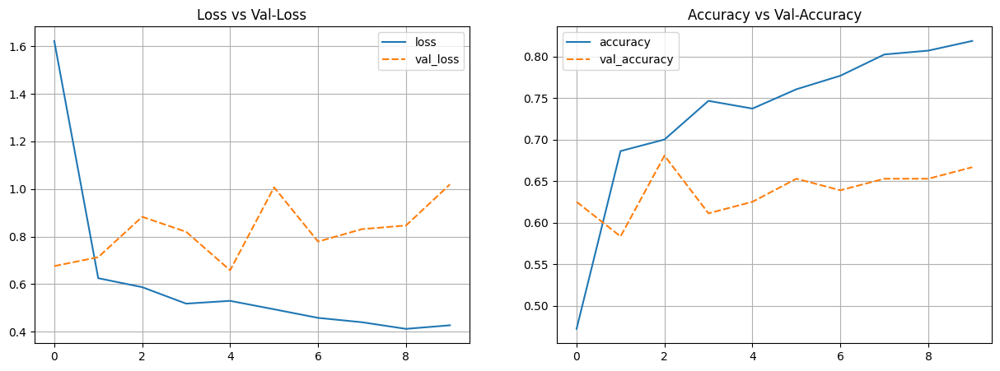

In [132]:
# Plot training results

history1_seq_df = pd.DataFrame(history1_seq.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history1_seq_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history1_seq_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

The model's accuracy improves over the course of the 10 epochs, starting from about 44.67% and reaching about 83.13%. This indicates that the model is learning to make better predictions as it is trained.

The loss decreases over the course of the 10 epochs, starting from about 2.0212 and reaching about 0.4006. This indicates that the model is making better predictions, as a lower loss means that the model's predictions are closer to the actual labels.

The validation accuracy and loss fluctuate over the course of the 10 epochs. This is normal and expected, as the model's parameters are adjusted during training. However, it's worth noting that the validation accuracy and loss do not consistently improve over the course of the 10 epochs. This could indicate that the model is overfitting to the training data, meaning that it is performing well on the training data but not as well on the validation data.

## 6.2 Functional API

### 6.2.1 Model Definition

In [133]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [134]:
# Define input layer
input_layer = Input(shape=(img_height, img_width, 3))

# Convolutional layers
conv1 = Conv2D(32, (3,3), activation='relu')(input_layer)
pool1 = MaxPooling2D(2, 2)(conv1)
conv2 = Conv2D(64, (3,3), activation='relu')(pool1)
pool2 = MaxPooling2D(2, 2)(conv2)
conv3 = Conv2D(128, (3,3), activation='relu')(pool2)
pool3 = MaxPooling2D(2, 2)(conv3)

# Flatten layer
flatten = Flatten()(pool3)

# Dropout layer
dropout = Dropout(0.5)(flatten)

# Fully connected layers
dense1 = Dense(512, activation='relu')(dropout)
output_layer = Dense(1, activation='sigmoid')(dense1)

# Define the model
model1_func = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model1_func.compile(loss='binary_crossentropy',
                             optimizer='adam',
                             metrics=['accuracy'])

model1_func.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 220, 220, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 218, 218, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 109, 109, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 107, 107, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    40,960,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,054,273 (156.61 MB)

 Trainable params: 41,054,273 (156.61 MB)

 Non-trainable params: 0 (0.00 B)

The model architecture consists of the following layers:

- input_layer: Input(shape=(img_height, img_width, 3)). This creates an input layer with a shape of (height, width, 3), where 3 corresponds to the RGB color channels.

- conv1: Conv2D(32, (3,3), activation='relu')(input_layer): This creates a convolutional layer with 32 filters, a kernel size of (3,3), and a rectified linear unit (ReLU) activation function.

- pool1: MaxPooling2D(2, 2)(conv1): This applies max pooling with a pool size of (2,2) to the output of the previous convolutional layer.

- conv2: Conv2D(64, (3,3), activation='relu')(pool1): This creates another convolutional layer with 64 filters, a kernel size of (3,3), and a ReLU activation function.

- pool2: MaxPooling2D(2, 2)(conv2): This applies max pooling with a pool size of (2,2) to the output of the previous convolutional layer.

- conv3: Conv2D(128, (3,3), activation='relu')(pool2): This creates another convolutional layer with 128 filters, a kernel size of (3,3), and a ReLU activation function.

- pool3: MaxPooling2D(2, 2)(conv3): This applies max pooling with a pool size of (2,2) to the output of the previous convolutional layer.

- flatten: Flatten()(pool3). This flattens the output of the previous layer into a 1D array.

- dropout: Dropout(0.5)(flatten). This applies dropout regularization with a probability of 0.5 to the input layer.

- dense1: Dense(512, activation='relu')(dropout): This creates a fully connected layer with 512 neurons and a ReLU activation function.

- output_layer: Dense(1, activation='sigmoid')(dense1): This creates the output layer with 1 neuron and a sigmoid activation function, which is suitable for binary classification.

The model is compiled with the following parameters:

- Loss Function: Binary cross-entropy loss function is used to measure the difference between the predicted probabilities and the true labels.

- Optimizer: Adam optimizer is used to minimize the loss function by updating the model weights.

- Metrics: Accuracy metric is used to evaluate the performance of the model.

### 6.2.2 Model Training

In [135]:
history1_func = model1_func.fit(train_set_final, epochs=10, validation_data=val_set_final, batch_size=batch_size)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - accuracy: 0.4975 - loss: 2.0153 - val_accuracy: 0.5000 - val_loss: 0.6874
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.6182 - loss: 0.6464 - val_accuracy: 0.6250 - val_loss: 0.7497
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.7573 - loss: 0.5040 - val_accuracy: 0.6111 - val_loss: 0.7732
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step - accuracy: 0.7753 - loss: 0.4702 - val_accuracy: 0.6389 - val_loss: 1.1047
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.8094 - loss: 0.4245 - val_accuracy: 0.5833 - val_loss: 1.5418
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.7722 - loss: 0.5333 - val_accuracy: 0.6528 - val_loss: 1.1525
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7996 - loss: 0.4349 - val_accuracy: 0.6389 - val_loss: 0.7995
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.8182 - loss: 0.4128 - val_accuracy: 0.6389 - val_loss: 1.0692
Epoch 9/

### 6.2.3 Model Evaluation

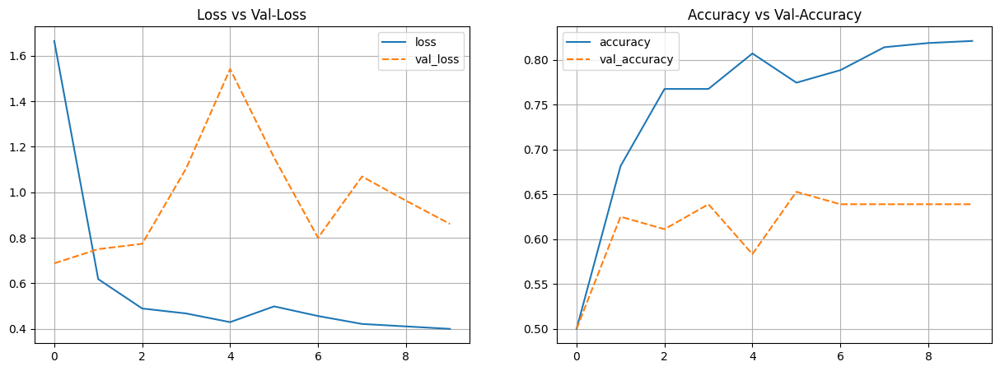

In [136]:
# Plot training results

history1_func_df = pd.DataFrame(history1_func.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history1_func_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history1_func_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

The output shows the training accuracy starts off low at around 50% in the first epoch, but gradually increases with each subsequent epoch, reaching a maximum of 84.27% in the ninth epoch. However, the validation accuracy remains relatively constant around 63.89%, indicating that the model is overfitting to the training data.

Overfitting occurs when the model learns the training data too well, to the point where it performs poorly on new, unseen data. This is evident in the large gap between the training and validation loss in the early epochs, which gradually decreases but never fully closes.

# 7. ANN Improvement (Sequential API/Functional API)

## 7.1 Sequential API

### Transfer Learning

We use Transfer Learning method to improve the model and we imports the `EfficientNetB0` model, initializes it with pre-trained weights, and sets it to be non-trainable. This allows the model to leverage the knowledge learned from the ImageNet dataset and prevent overfitting during training.

In [22]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input

pretrained_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(img_height,img_width, 3))
pretrained_model.trainable = False

The pre-trained model is then set to be non-trainable by setting the trainable attribute to False. This means that the weights of the pre-trained model will not be updated during training, effectively freezing the model.

By using a pre-trained model, the model can leverage the knowledge learned from the large ImageNet dataset, which can help improve the performance of the model on new, unseen data. Additionally, freezing the pre-trained model can help prevent overfitting and reduce the number of parameters that need to be trained, making training faster and more efficient.

In [15]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,
                                                                   zoom_range=0.05,
                                                                   width_shift_range=0.05,
                                                                   height_shift_range=0.05,
                                                                   shear_range=0.05,
                                                                   horizontal_flip=True,
                                                                   validation_split=0.4,
                                                                   preprocessing_function=preprocess_input)

train_set_final = train_datagen_tl.flow_from_directory(train_path,
                                                      target_size=(img_height,img_width),
                                                      class_mode='binary',
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set_final = train_datagen_tl.flow_from_directory(val_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='binary',
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)


test_set_final = train_datagen_tl.flow_from_directory(test_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='binary',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

Found 430 images belonging to 2 classes.
Found 72 images belonging to 2 classes.
Found 224 images belonging to 2 classes.


Before we train the model using Transfer Learning Method we add the preprocessing_function parameter in the ImageDataGenerator class is used to apply a preprocessing function to the input images before they are fed into the model. The preprocess_input function from the tensorflow.keras.applications.efficientnet module is used to preprocess the input images for models that have been pre-trained on the ImageNet dataset.

### 7.1.1 Model Definition

In [21]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [23]:
# Create Sequential API model

model_tl_seq = Sequential()
# Add input layer
model_tl_seq.add(Input(shape=(img_height, img_width,3)))
# Add convolutional layers
model_tl_seq.add(pretrained_model)

model_tl_seq.add(Flatten())
model_tl_seq.add(Dense(512, activation='relu'))
model_tl_seq.add(Dense(1, activation='sigmoid'))

# Compile
model_tl_seq.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_tl_seq.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 62720)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    32,113,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 36,163,236 (137.95 MB)

 Trainable params: 32,113,665 (122.50 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

- First, an input layer is added to the model using the Input class. The input layer specifies the shape of the input images, which is defined by the img_height and img_width variables.

- Next, the pre-trained `EfficientNetB0` model is added to the sequential model using the add method. This allows the sequential model to leverage the knowledge learned from the pre-trained model.

- After the pre-trained model, a flatten layer is added to the sequential model. The flatten layer reshapes the output of the pre-trained model into a 1D array, which can be fed into a fully-connected layer.

- Next, a fully-connected layer with 512 nodes and a ReLU activation function is added to the sequential model. This layer will learn high-level features from the output of the pre-trained model.

- Finally, a fully-connected layer with 1 node and a sigmoid activation function is added to the sequential model. This layer will output a probability value between 0 and 1, which can be interpreted as the likelihood of the input image belonging to a certain class.

- After the layers have been added to the sequential model, the model is compiled using the compile method. The loss parameter is set to binary_crossentropy to indicate that the model will be used for binary classification. The optimizer parameter is set to adam to specify the optimization algorithm that will be used during training. The metrics parameter is set to accuracy to specify the metric that will be used to evaluate the performance of the model.

- In summary, the model is constructed by adding an input layer, a pre-trained model, a flatten layer, and fully-connected layers. The model is then compiled with a binary cross-entropy loss function, the Adam optimizer, and accuracy as the evaluation metric.

### 7.1.1 Model Training

In [24]:
history_tl_seq = model_tl_seq.fit(train_set_final, epochs=10, validation_data=val_set_final, batch_size=batch_size)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 57s 5s/step - accuracy: 0.5095 - loss: 10.9639 - val_accuracy: 0.5000 - val_loss: 0.8119
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - accuracy: 0.6217 - loss: 0.6239 - val_accuracy: 0.7361 - val_loss: 0.6702
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.7013 - loss: 0.6286 - val_accuracy: 0.8611 - val_loss: 0.5192
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.7604 - loss: 0.4902 - val_accuracy: 0.8889 - val_loss: 0.3392
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.8518 - loss: 0.3553 - val_accuracy: 0.9028 - val_loss: 0.2427
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.8919 - loss: 0.2494 - val_accuracy: 0.9167 - val_loss: 0.2230
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.9710 - loss: 0.1266 - val_accuracy: 0.8889 - val_loss: 0.2310
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.9682 - loss: 0.1004 - val_accuracy: 0.8194 - val_loss: 0.3325
Epoch 9

### 7.1.3 Model Evaluation

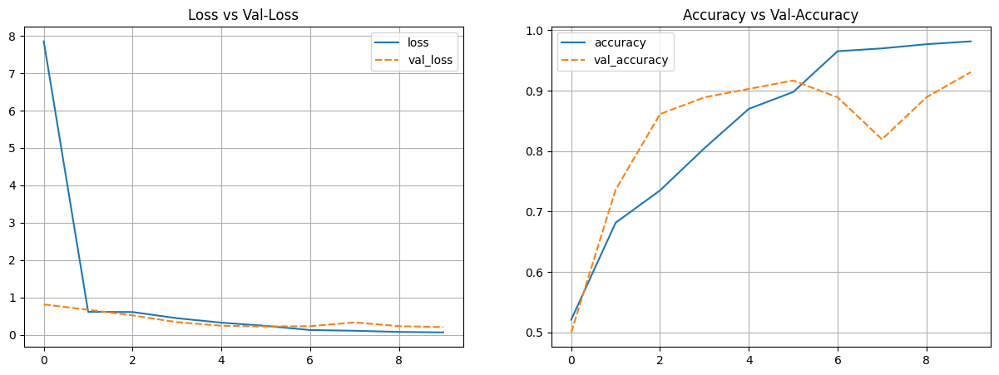

In [25]:
# Plot training results

history_tl_seq_df = pd.DataFrame(history_tl_seq.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_seq_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_seq_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

We can see that the accuracy of the model on the training set increases with each epoch, while the loss decreases. This indicates that the model is learning to classify the images in the training set more accurately as the training process progresses. The accuracy of the model on the validation set also increases with each epoch, indicating that the model is able to generalize well to new, unseen data.

In summary, this output shows the progress of the training process for a deep learning model. The accuracy and loss values for both the training and validation sets are shown for each epoch. The output indicates that the model is learning to classify the images in the training set more accurately as the training process progresses, and that the model is able to generalize well to new, unseen data.

## 7.2 Functional API

### 7.2.1 Model Definition

In [26]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [27]:
# Define input layer
input_layer = Input(shape=(img_height, img_width, 3))

# Add the pretrained model
pretrained_model_output = pretrained_model(input_layer)

# Flatten layer
flatten = Flatten()(pretrained_model_output)

# Fully connected layers
dense1 = Dense(512, activation='relu')(flatten)
output_layer = Dense(1, activation='sigmoid')(dense1)

# Define the model
model_tl_func = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model_tl_func.compile(loss='binary_crossentropy',
                             optimizer='adam',
                             metrics=['accuracy'])

model_tl_func.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 220, 220, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 62720)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    32,113,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 36,163,236 (137.95 MB)

 Trainable params: 32,113,665 (122.50 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

- First, an input layer is defined using the Input class. The input layer specifies the shape of the input images, which is defined by the img_height and img_width variables.

- Next, the pre-trained `EfficientNetB0` model is added to the model using the pretrained_model variable. The pre-trained model is applied to the input layer using the pretrained_model function. This allows the model to leverage the knowledge learned from the pre-trained model.

- After the pre-trained model, a flatten layer is added to the model. The flatten layer reshapes the output of the pre-trained model into a 1D array, which can be fed into a fully-connected layer.

- Next, a fully-connected layer with 512 nodes and a ReLU activation function is added to the model. This layer will learn high-level features from the output of the pre-trained model.

- Finally, a fully-connected layer with 1 node and a sigmoid activation function is added to the model. This layer will output a probability value between 0 and 1, which can be interpreted as the likelihood of the input image belonging to a certain class.

- After the layers have been defined, the model is constructed by connecting the input layer to the flatten layer, and the flatten layer to the fully-connected layers. The model is then compiled using the compile method. The loss parameter is set to binary_crossentropy to indicate that the model will be used for binary classification. The optimizer parameter is set to adam to specify the optimization algorithm that will be used during training. The metrics parameter is set to accuracy to specify the metric that will be used to evaluate the performance of the model.

- In summary, the model is constructed by defining layers and connecting them together using the tensorflow.keras API. The model is then compiled with a binary cross-entropy loss function, the Adam optimizer, and accuracy as the evaluation metric.

### 7.2.2 Model Traning

In [28]:
history_tl_func = model_tl_func.fit(train_set_final, epochs=10, validation_data=val_set_final, batch_size=batch_size)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 96s 4s/step - accuracy: 0.5500 - loss: 10.4287 - val_accuracy: 0.5000 - val_loss: 0.7198
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.6324 - loss: 0.6910 - val_accuracy: 0.6250 - val_loss: 0.6783
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.7085 - loss: 0.6277 - val_accuracy: 0.6389 - val_loss: 0.6183
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.6471 - loss: 0.5773 - val_accuracy: 0.8194 - val_loss: 0.5268
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.8152 - loss: 0.4767 - val_accuracy: 0.8889 - val_loss: 0.3536
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.8793 - loss: 0.2621 - val_accuracy: 0.8611 - val_loss: 0.3107
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.9037 - loss: 0.2120 - val_accuracy: 0.9306 - val_loss: 0.2104
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.9360 - loss: 0.1620 - val_accuracy: 0.9167 - val_loss: 0.1948
Epoch 9

### 7.2.3 Model Evaluation

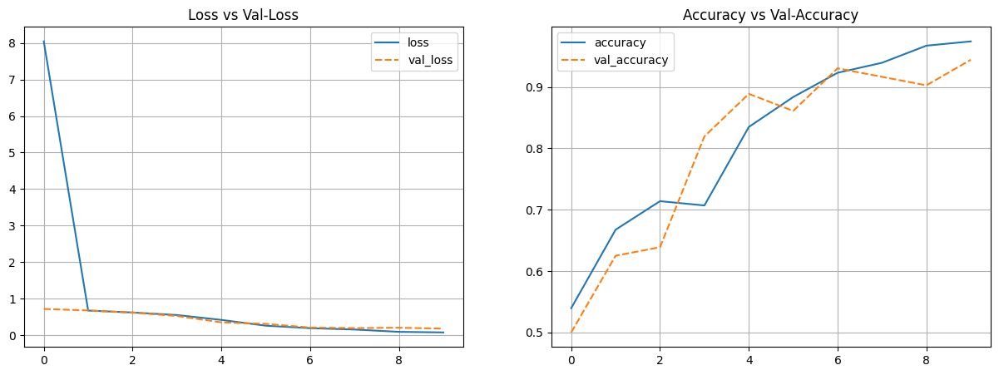

In [29]:
# Plot training results

history_tl_func_df = pd.DataFrame(history_tl_func.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_func_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_func_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

We can see that the accuracy of the model on the training set increases with each epoch, while the loss decreases. This indicates that the model is learning to classify the images in the training set more accurately as the training process progresses. The accuracy of the model on the validation set also increases with each epoch, indicating that the model is able to generalize well to new, unseen data.

In summary, this output shows the progress of the training process for a deep learning model. The accuracy and loss values for both the training and validation sets are shown for each epoch. The output indicates that the model is learning to classify the images in the training set more accurately as the training process progresses, and that the model is able to generalize well to new, unseen data.

## 7.3 Overall Summary

After training the model using Sequential and Functional methods, we improved the model's performance using Transfer Learning. Our evaluation revealed that the Functional approach, augmented by transfer learning, yielded the best results. We then assessed the model's accuracy using our test dataset to verify its predictive capabilities on unseen data.

In [35]:
result=model_tl_func.evaluate(test_set_final)
print('loss',result[0])
print('Acc',result[1])

4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.8686 - loss: 0.3736
loss 0.4078734815120697
Acc 0.8616071343421936


We can see that the model has a loss of 0.4078734815120697 and an accuracy of 0.8616071343421936 on the test set. This indicates that the model is able to classify the images in the test set with a high degree of accuracy. Now we can save the model, so we can try to predict using inference data

# 8. Model Saving

In [37]:
#save model
model_tl_func.save('model.keras')

Saving the model as keras extension

## [**Model Link**](https://drive.google.com/file/d/1WyNnDy-FQLIONTo5Yh8Ug47nTVv5udJd/view?usp=sharing)

# 9. Model Inference

For Model Inference we do the test on the other notebook

# 10. Conclusion

## 10.1 EDA

The data distribution is balance with 50% on smoking and 50% on Not Smoking so we don't need any balancing technique in feature engineering

## 10.2 Model

The training accuracy of 0.9673 suggests that the model is correctly classifying 96.73% of the training examples. This is a strong result, indicating that the model has learned to generalize well from the training data.

The validation accuracy of 0.9444 indicates that the model is correctly classifying 94.44% of the validation examples. This is a strong result, suggesting that the model has learned to generalize well to new data.

In summary, the metrics suggest that the model is performing well and is capable of making accurate predictions for both the training and validation data.

## 10.3 Model Recommendation

Since the accuracy prediction score is 94.44% the model still can made some mistake to predict the image. And we try to evaluate the model using image from test_set which never used for training and the accuracy got 86,1%. So we can do improvement more by using Data Augmentation or added more layer when training the model.

## 10.3 Business Insight

The model could be used to monitor smoking rates in different communities and identify areas where smoking is more prevalent. This information could be used to inform public health campaigns and interventions aimed at reducing smoking rates.

In addition, a deep learning model that can predict whether an image contains a person smoking or not smoking could also be used in the field of marketing and advertising. For example, the model could be used to analyze images of people in advertisements and determine whether they are smoking or not smoking. This information could be used to ensure that advertisements comply with regulations regarding the depiction of smoking in advertising.

Overall, a deep learning model that can predict whether an image contains a person smoking or not smoking has the potential to be a valuable tool in a variety of business contexts. It can help businesses and organizations enforce smoking regulations, monitor smoking rates, and ensure compliance with advertising regulations.